<a href="https://colab.research.google.com/github/AmirAzz/Test/blob/main/ObjectYOLO8Complete.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Fri Feb 24 08:16:39 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   57C    P0    17W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [3]:
# Pip install method (recommended)

!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.4/78.2 GB disk)


In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

In [5]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow -q
from roboflow import Roboflow
rf = Roboflow(api_key="bHMLvHCM81fQAFzH88JP")
project = rf.workspace("ucy").project("rn-uav6")
dataset = project.version(1).download("yolov8")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 KB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 4.7 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to RN-UAV6-1 in yolov8:: 100%|██████████| 1182/1182 [00:01<00:00, 808.72it/s] 


In [6]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=10 imgsz=800 plots=True

/content
100% 21.5M/21.5M [00:00<00:00, 160MB/s]

Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/datasets/RN-UAV6-1/data.yaml, epochs=10, patience=50, batch=16, imgsz=800, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, 

In [7]:
!ls {HOME}/runs/detect/train/

args.yaml					    train_batch1.jpg
confusion_matrix.png				    train_batch2.jpg
events.out.tfevents.1677226893.c29a1e70ddeb.1913.0  val_batch0_labels.jpg
F1_curve.png					    val_batch0_pred.jpg
P_curve.png					    val_batch1_labels.jpg
PR_curve.png					    val_batch1_pred.jpg
R_curve.png					    val_batch2_labels.jpg
results.csv					    val_batch2_pred.jpg
results.png					    weights
train_batch0.jpg


/content


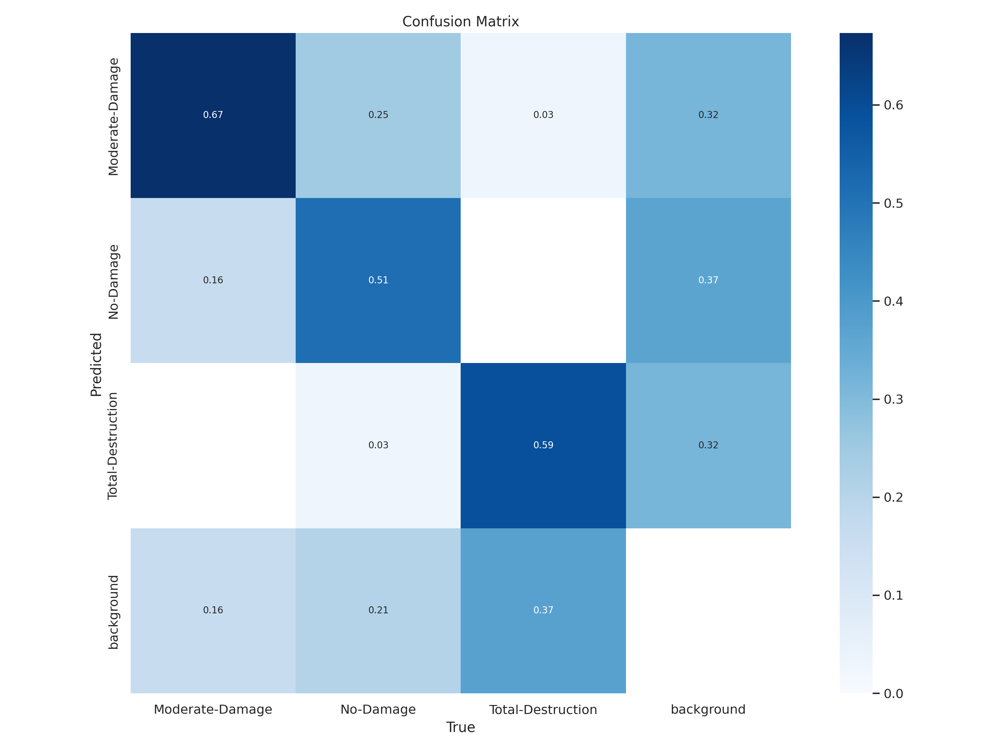

In [8]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

In [9]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=50 imgsz=800 plots=True

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/datasets/RN-UAV6-1/data.yaml, epochs=50, patience=50, batch=16, imgsz=800, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False

In [10]:
!ls {HOME}/runs/detect/train2/

args.yaml					    train_batch1121.jpg
confusion_matrix.png				    train_batch1122.jpg
events.out.tfevents.1677227272.c29a1e70ddeb.3810.0  train_batch1.jpg
F1_curve.png					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg
PR_curve.png					    val_batch0_pred.jpg
R_curve.png					    val_batch1_labels.jpg
results.csv					    val_batch1_pred.jpg
results.png					    val_batch2_labels.jpg
train_batch0.jpg				    val_batch2_pred.jpg
train_batch1120.jpg				    weights


/content


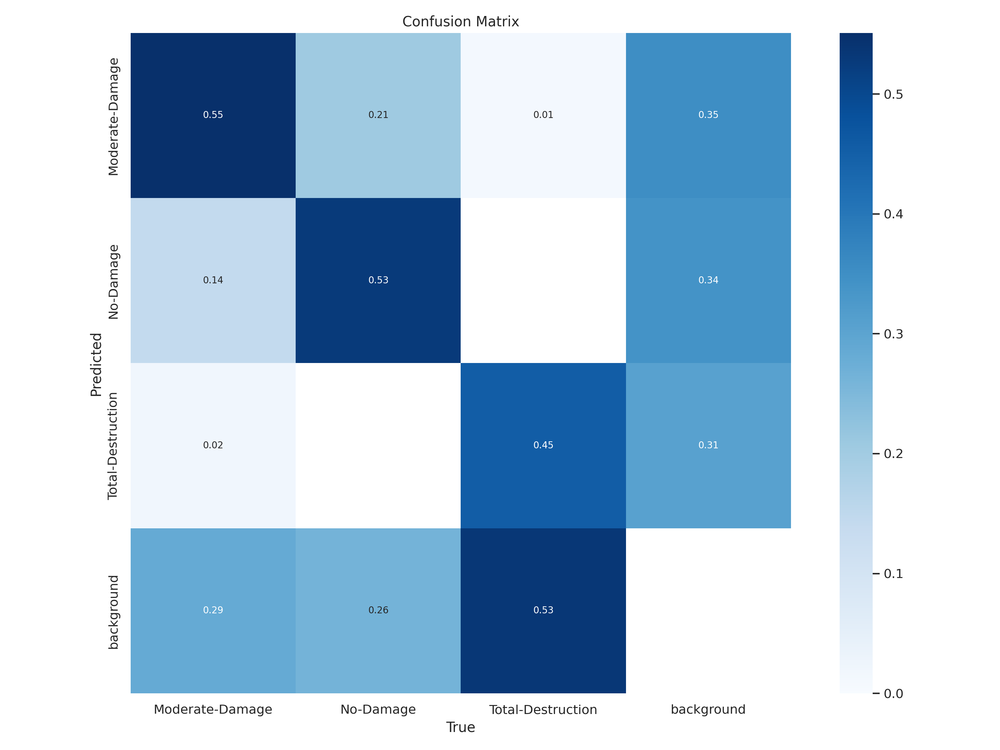

In [11]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/confusion_matrix.png', width=600)

/content


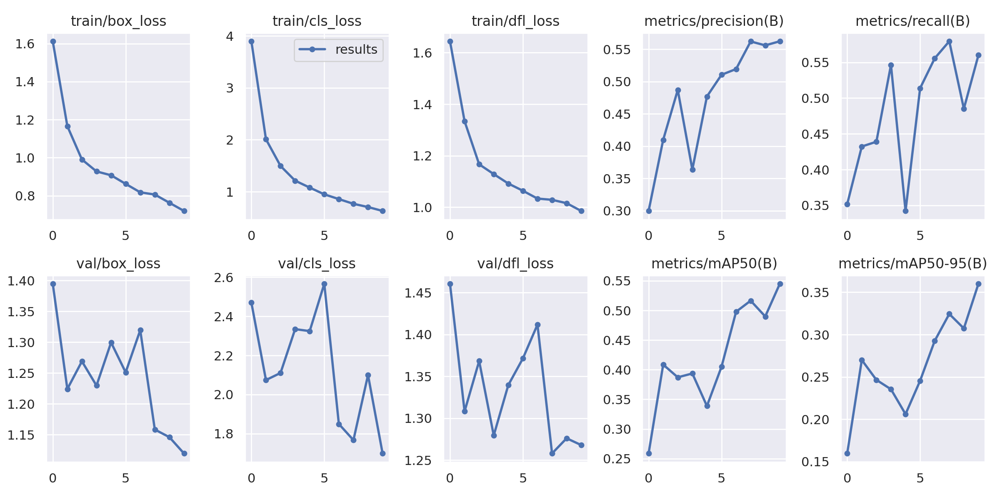

In [12]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

/content


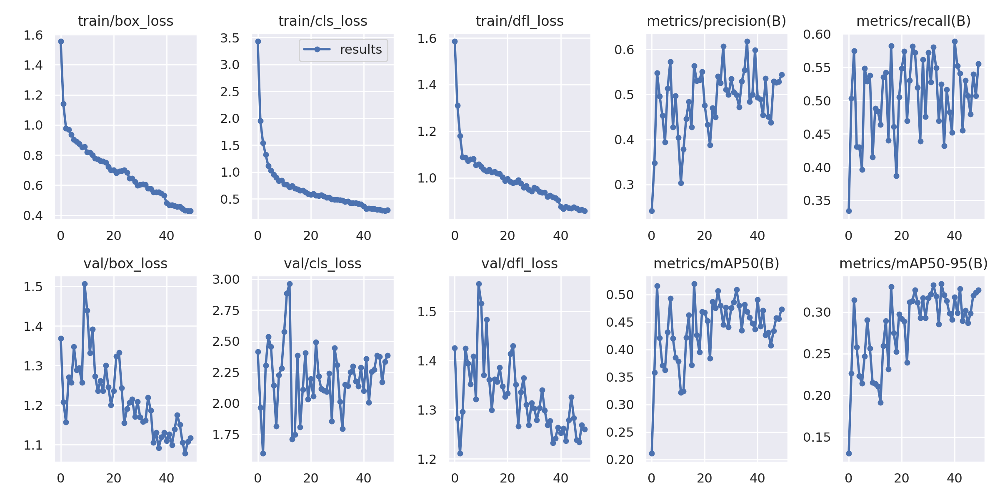

In [13]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/results.png', width=600)

/content


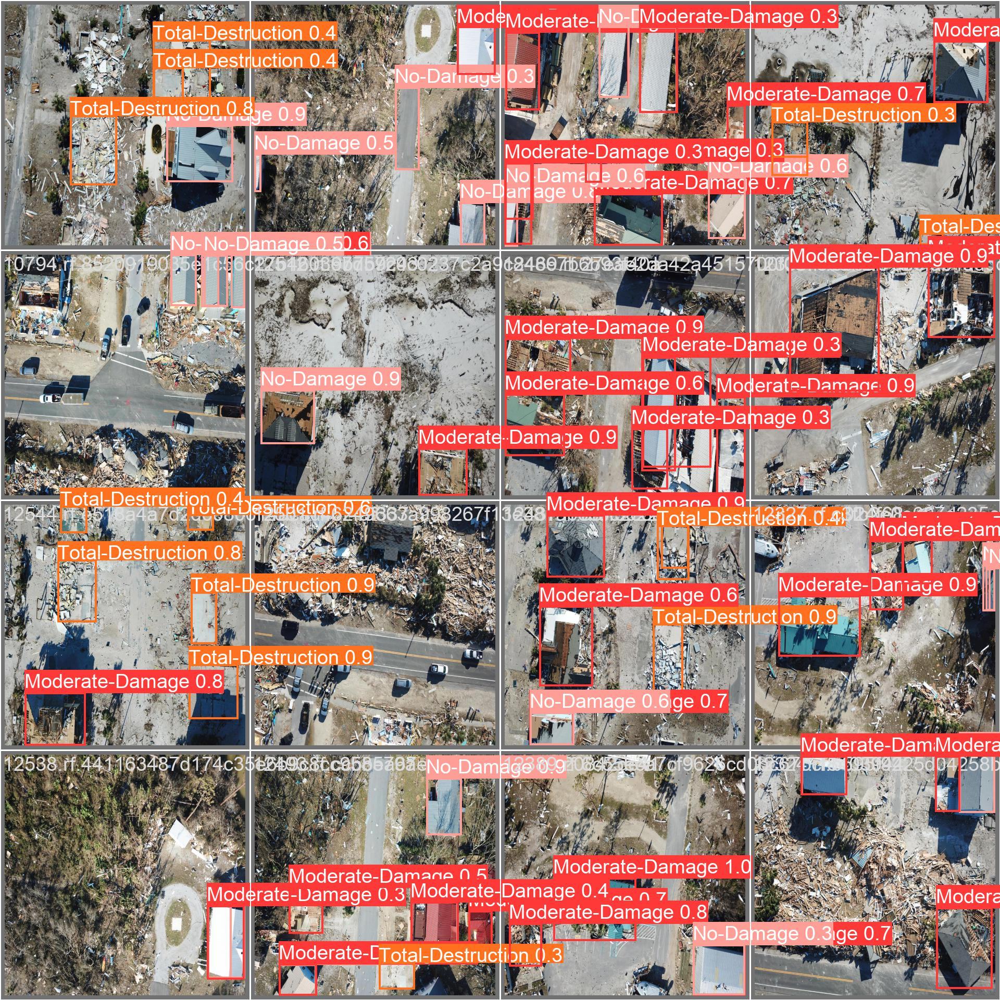

In [14]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

/content


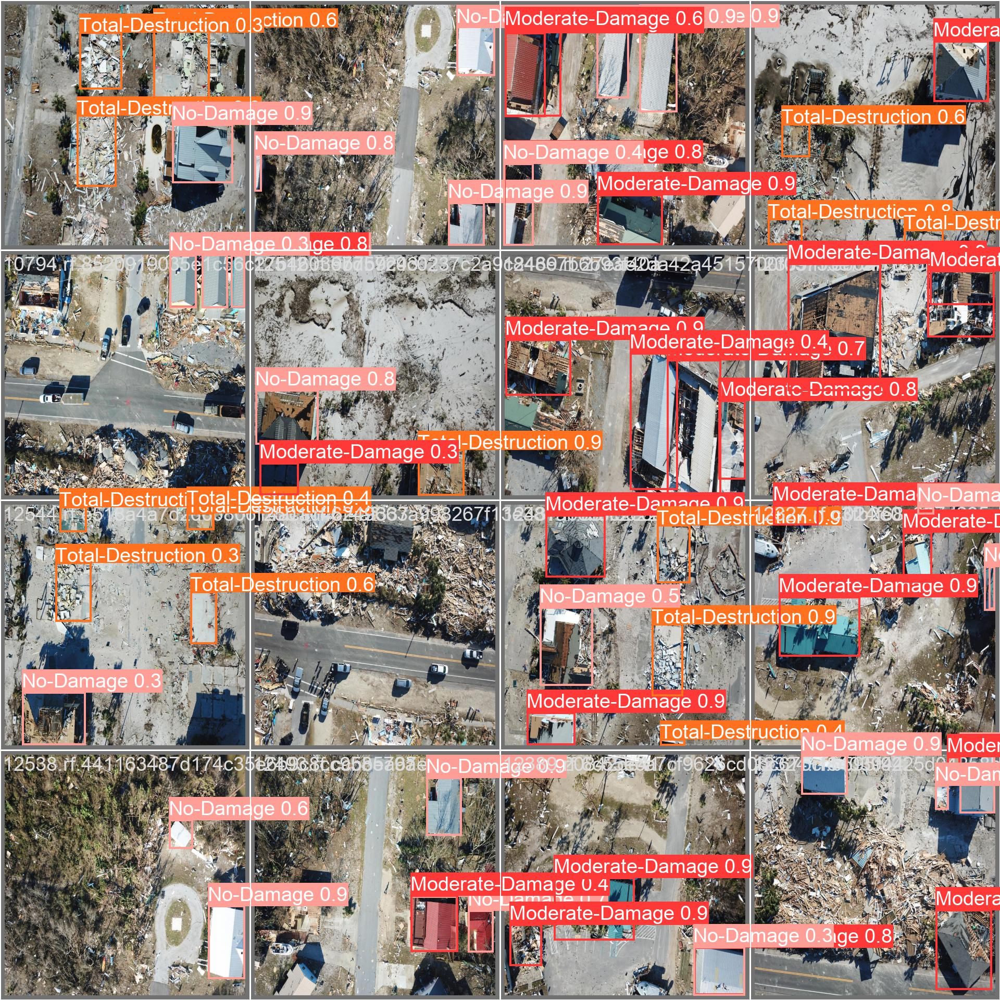

In [15]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/val_batch0_pred.jpg', width=600)

In [16]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/RN-UAV6-1/valid/labels.cache... 71 images, 0 backgrounds, 0 corrupt: 100% 71/71 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 5/5 [00:07<00:00,  1.53s/it]
                   all         71        258      0.565      0.561      0.546      0.363
       Moderate-Damage         71         49      0.406      0.656      0.496      0.355
             No-Damage         71        121      0.632      0.482      0.592      0.449
     Total-Destruction         71         88      0.657      0.545       0.55      0.285
Speed: 13.0ms pre-process, 19.6ms inference, 0.0ms loss, 4.5ms post-process per image


In [17]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train2/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/RN-UAV6-1/valid/labels.cache... 71 images, 0 backgrounds, 0 corrupt: 100% 71/71 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 5/5 [00:07<00:00,  1.56s/it]
                   all         71        258      0.498       0.58      0.509      0.332
       Moderate-Damage         71         49      0.298      0.592      0.404       0.29
             No-Damage         71        121      0.646      0.636      0.653      0.489
     Total-Destruction         71         88      0.551      0.511       0.47      0.218
Speed: 4.7ms pre-process, 20.6ms inference, 0.0ms loss, 6.5ms post-process per image


In [18]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs
image 1/73 /content/datasets/RN-UAV6-1/test/images/10794.rf.2c64a6b7385b724b14cff49f6c12a919.jpg: 800x800 3 Total-Destructions, 26.3ms
image 2/73 /content/datasets/RN-UAV6-1/test/images/11282.rf.84c060b237b2588a976f8678b42d362c.jpg: 800x800 1 Moderate-Damage, 1 No-Damage, 26.3ms
image 3/73 /content/datasets/RN-UAV6-1/test/images/11290.rf.62bda42b7eec56809f3becc2e1843165.jpg: 800x800 3 Moderate-Damages, 1 No-Damage, 26.3ms
image 4/73 /content/datasets/RN-UAV6-1/test/images/11298.rf.31ed699d6a264a8052f4fe2cf1a5c8c7.jpg: 800x800 1 Moderate-Damage, 1 No-Damage, 26.3ms
image 5/73 /content/datasets/RN-UAV6-1/test/images/11343.rf.4690c505e19a4340e9a2a5c1d61847fa.jpg: 800x800 4 Moderate-Damages, 1 No-Damage, 1 Total-Destruction, 26.4ms
image 6/73 /content/datasets/RN-UAV6-1/test/images/11358.rf.a8884c722bf556544e25a335e

In [19]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train2/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs
image 1/73 /content/datasets/RN-UAV6-1/test/images/10794.rf.2c64a6b7385b724b14cff49f6c12a919.jpg: 800x800 1 Total-Destruction, 26.2ms
image 2/73 /content/datasets/RN-UAV6-1/test/images/11282.rf.84c060b237b2588a976f8678b42d362c.jpg: 800x800 1 Moderate-Damage, 26.3ms
image 3/73 /content/datasets/RN-UAV6-1/test/images/11290.rf.62bda42b7eec56809f3becc2e1843165.jpg: 800x800 1 Moderate-Damage, 2 No-Damages, 25.2ms
image 4/73 /content/datasets/RN-UAV6-1/test/images/11298.rf.31ed699d6a264a8052f4fe2cf1a5c8c7.jpg: 800x800 3 Moderate-Damages, 1 No-Damage, 25.2ms
image 5/73 /content/datasets/RN-UAV6-1/test/images/11343.rf.4690c505e19a4340e9a2a5c1d61847fa.jpg: 800x800 3 No-Damages, 1 Total-Destruction, 25.4ms
image 6/73 /content/datasets/RN-UAV6-1/test/images/11358.rf.a8884c722bf556544e25a335ee0af50d.jpg: 800x800 2 Moderate-

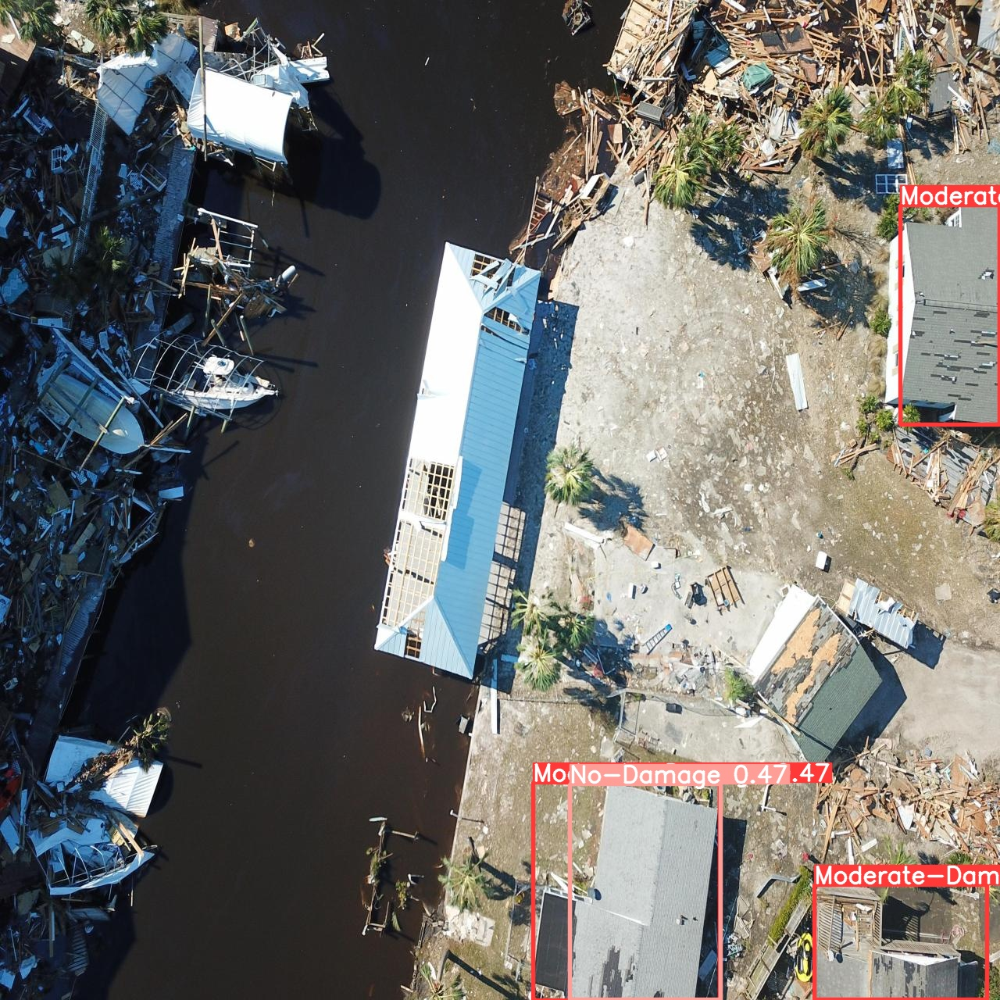

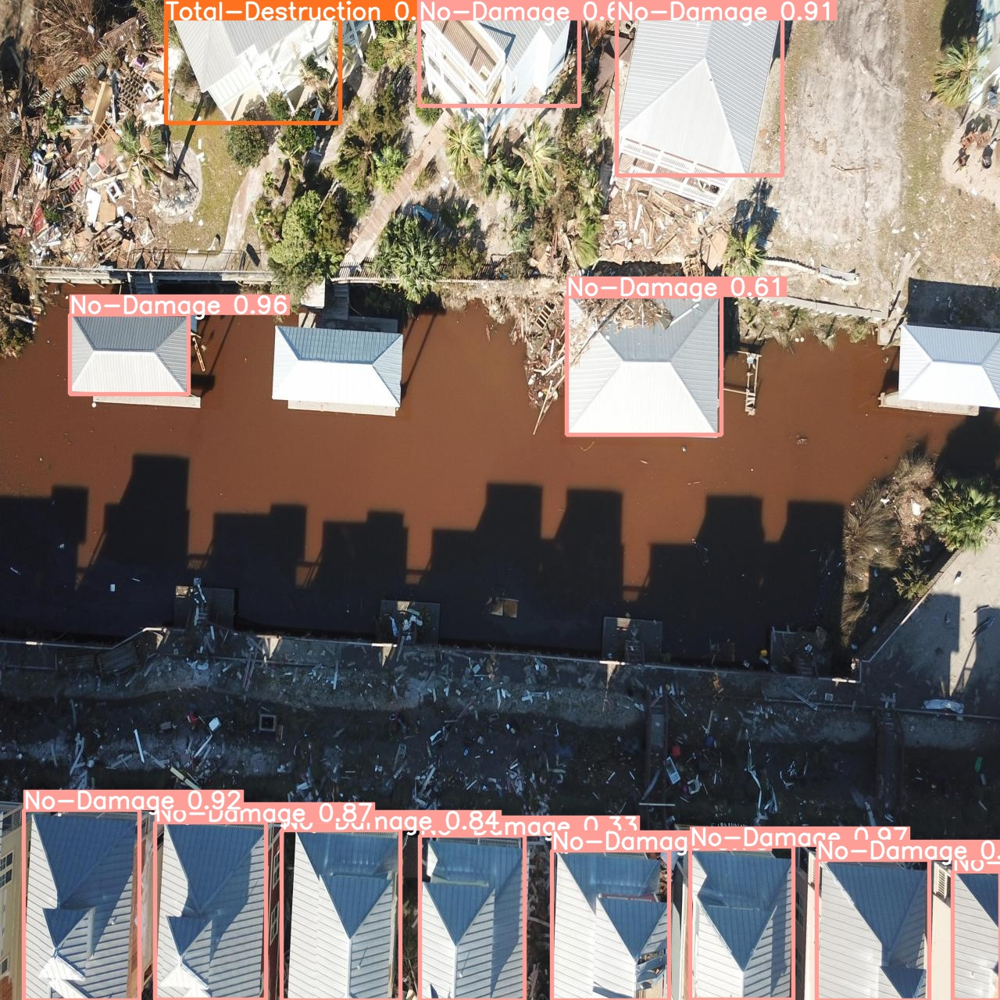

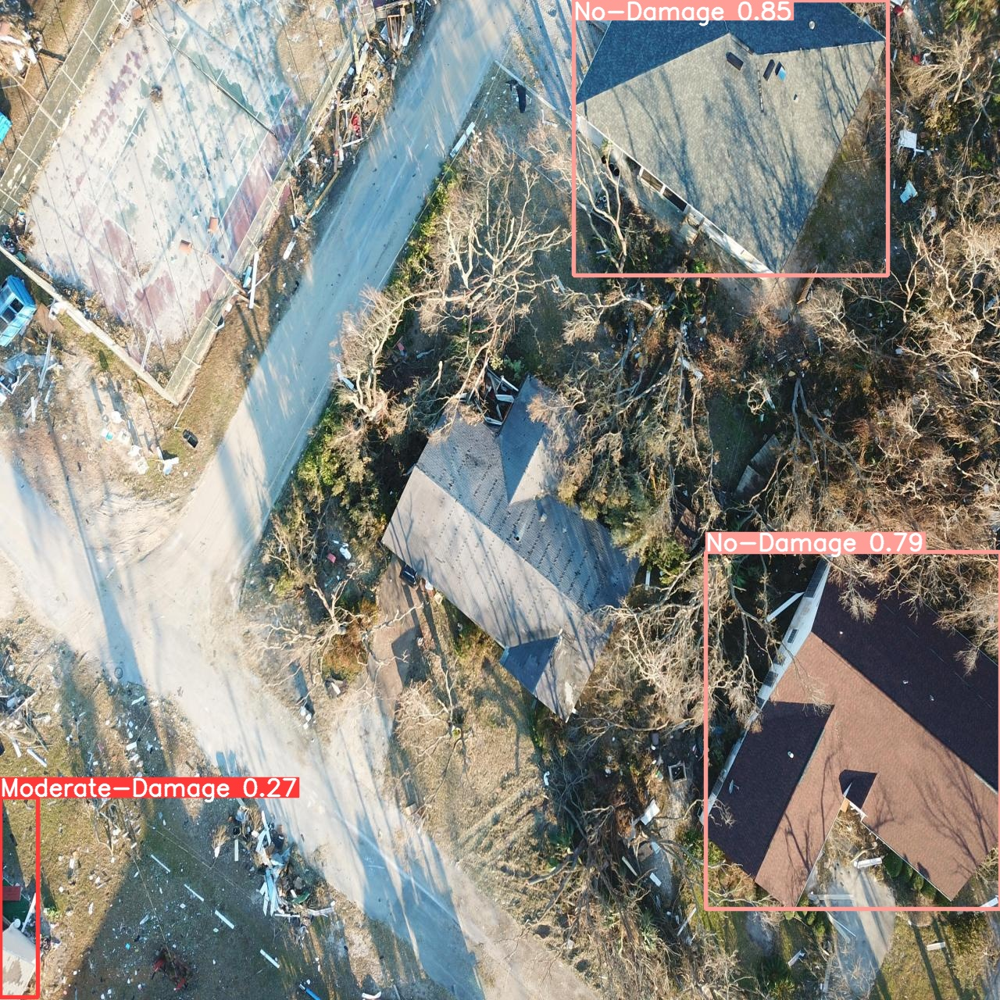

In [20]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

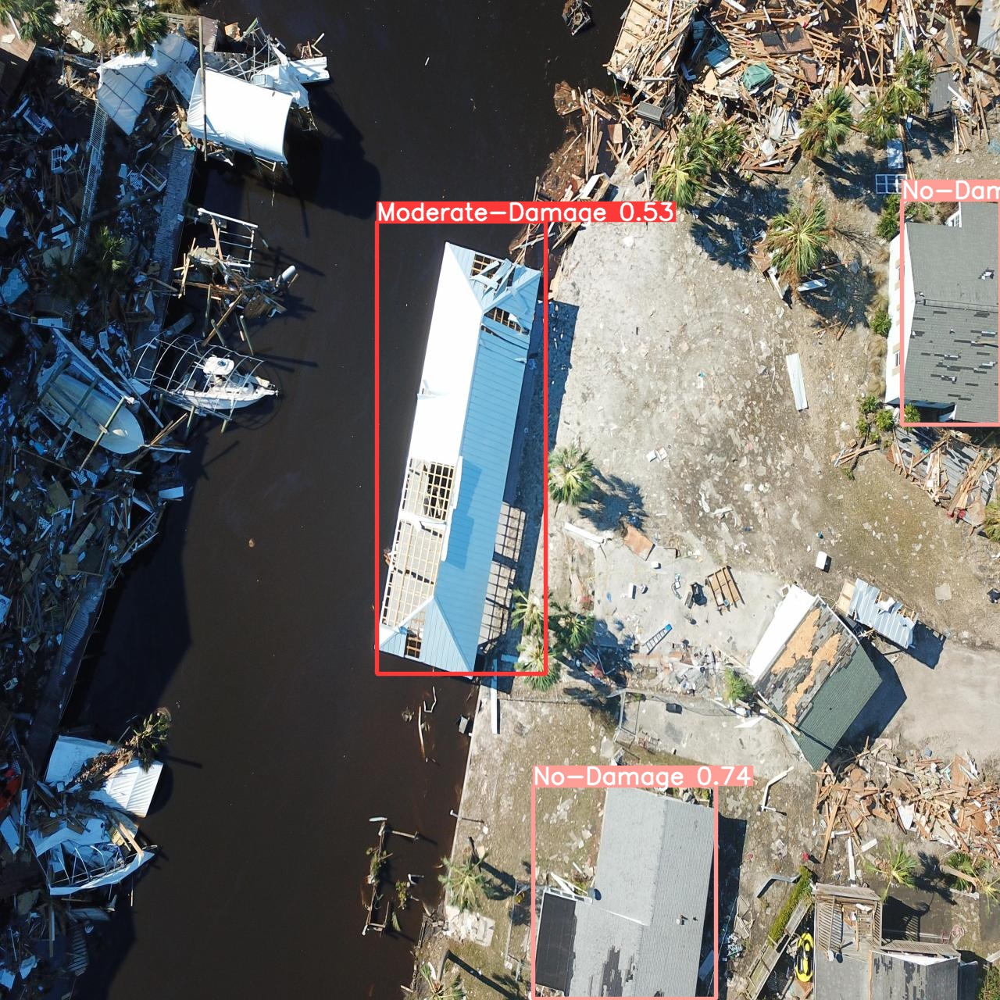

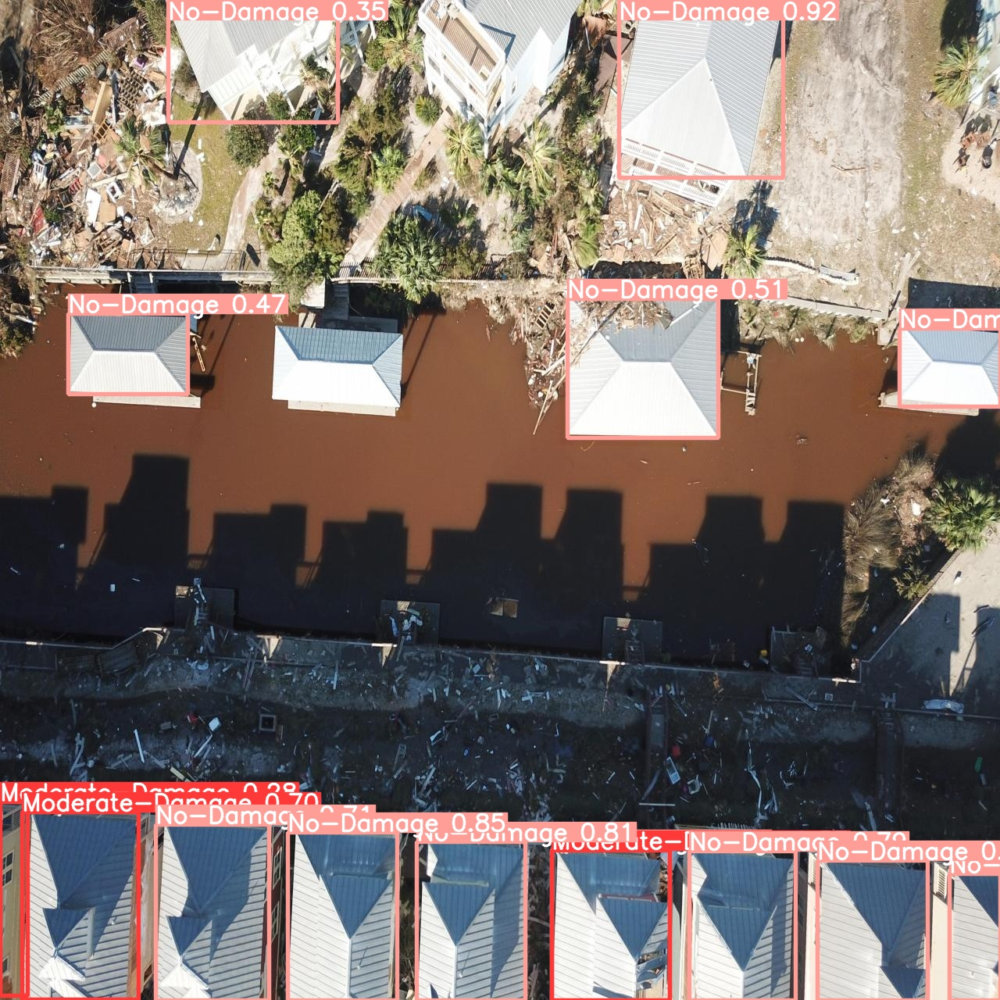

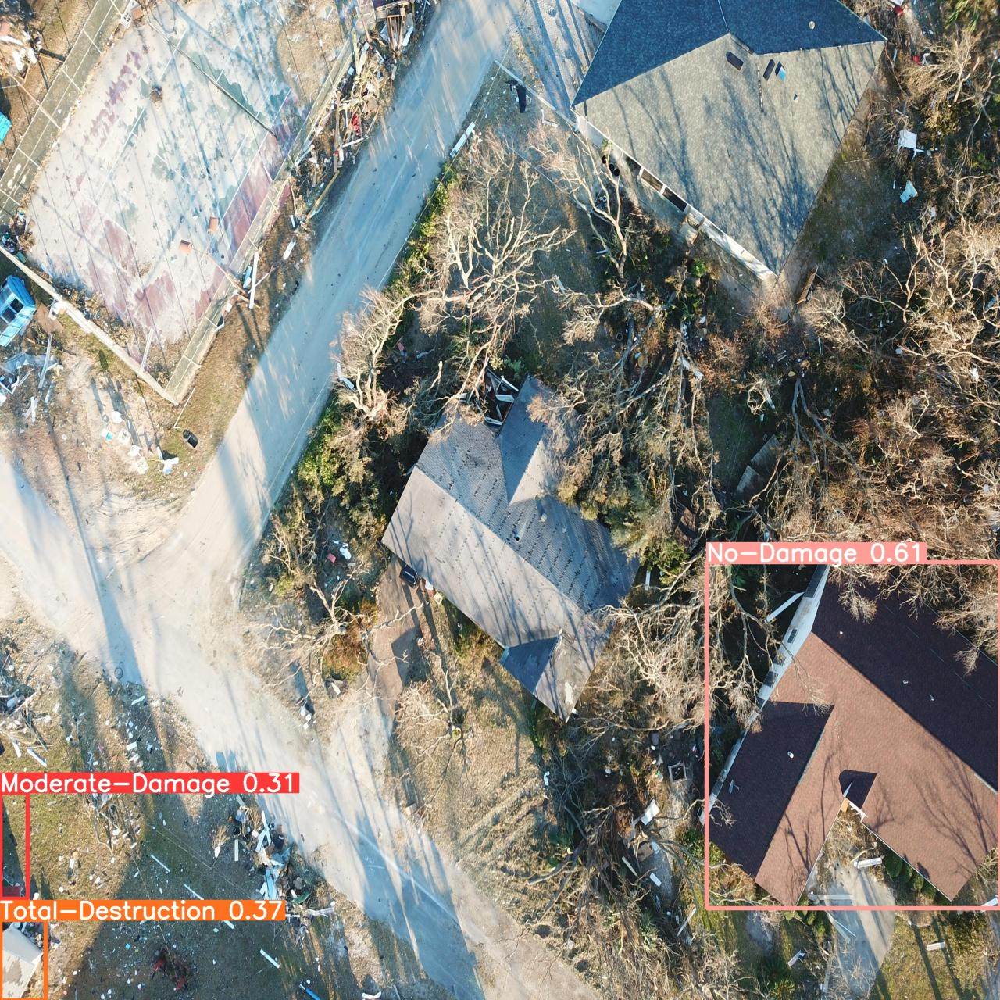

In [21]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict2/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

/content


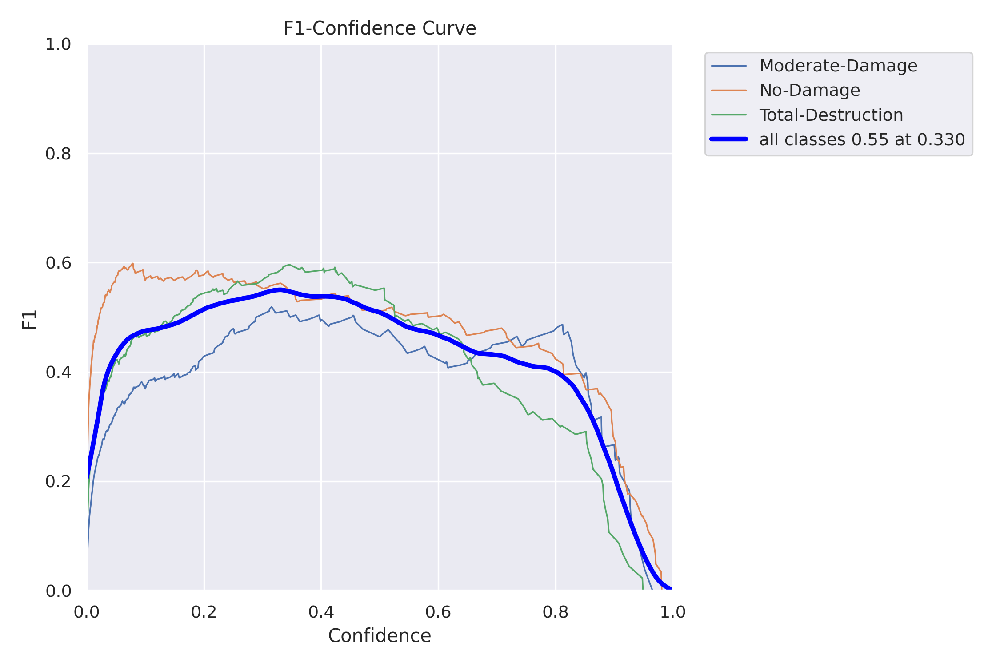

In [22]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/F1_curve.png', width=600)

/content


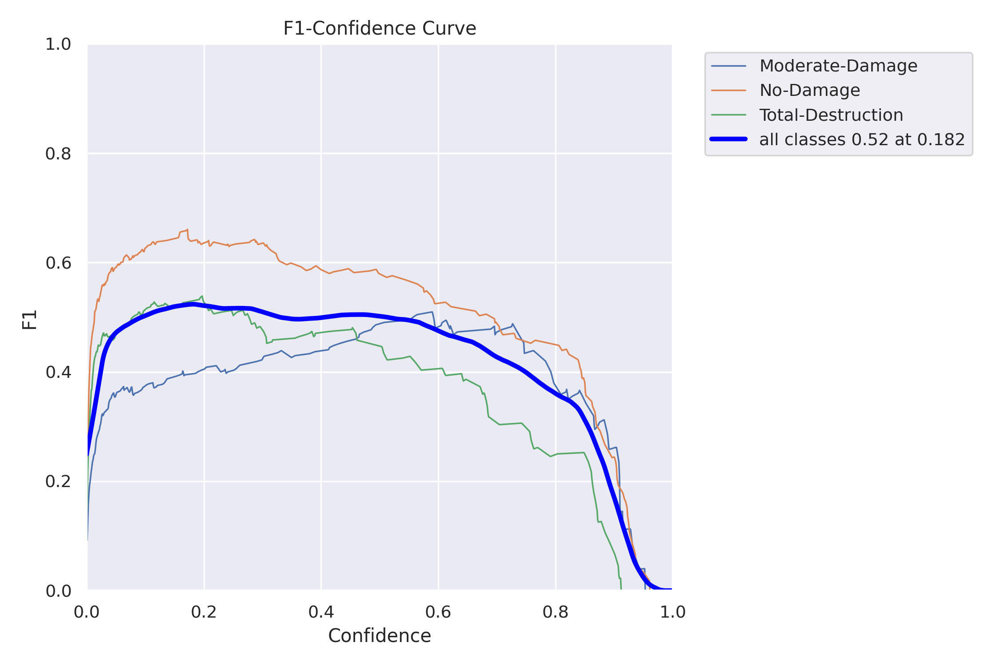

In [23]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/F1_curve.png', width=600)

/content


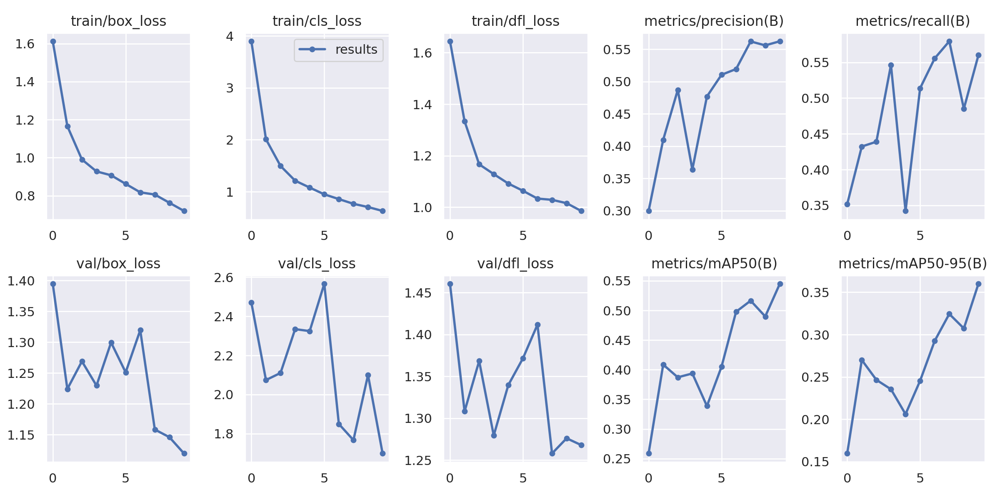

In [24]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

In [25]:
project.version(dataset.version).deploy(model_type="yolov8", model_path=f"{HOME}/runs/detect/train/")

An error occured when getting the model upload URL: This version already has a trained model. Please generate and train a new version in order to upload model to Roboflow.


In [26]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/RN-UAV6-1/valid/labels.cache... 71 images, 0 backgrounds, 0 corrupt: 100% 71/71 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 5/5 [00:07<00:00,  1.56s/it]
                   all         71        258      0.565      0.561      0.546      0.363
       Moderate-Damage         71         49      0.406      0.656      0.496      0.355
             No-Damage         71        121      0.632      0.482      0.592      0.449
     Total-Destruction         71         88      0.657      0.545       0.55      0.285
Speed: 4.2ms pre-process, 20.8ms inference, 0.0ms loss, 9.8ms post-process per image


In [27]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs
image 1/73 /content/datasets/RN-UAV6-1/test/images/10794.rf.2c64a6b7385b724b14cff49f6c12a919.jpg: 800x800 3 Total-Destructions, 26.2ms
image 2/73 /content/datasets/RN-UAV6-1/test/images/11282.rf.84c060b237b2588a976f8678b42d362c.jpg: 800x800 1 Moderate-Damage, 1 No-Damage, 26.3ms
image 3/73 /content/datasets/RN-UAV6-1/test/images/11290.rf.62bda42b7eec56809f3becc2e1843165.jpg: 800x800 3 Moderate-Damages, 1 No-Damage, 26.2ms
image 4/73 /content/datasets/RN-UAV6-1/test/images/11298.rf.31ed699d6a264a8052f4fe2cf1a5c8c7.jpg: 800x800 1 Moderate-Damage, 1 No-Damage, 26.3ms
image 5/73 /content/datasets/RN-UAV6-1/test/images/11343.rf.4690c505e19a4340e9a2a5c1d61847fa.jpg: 800x800 4 Moderate-Damages, 1 No-Damage, 1 Total-Destruction, 26.3ms
image 6/73 /content/datasets/RN-UAV6-1/test/images/11358.rf.a8884c722bf556544e25a335e

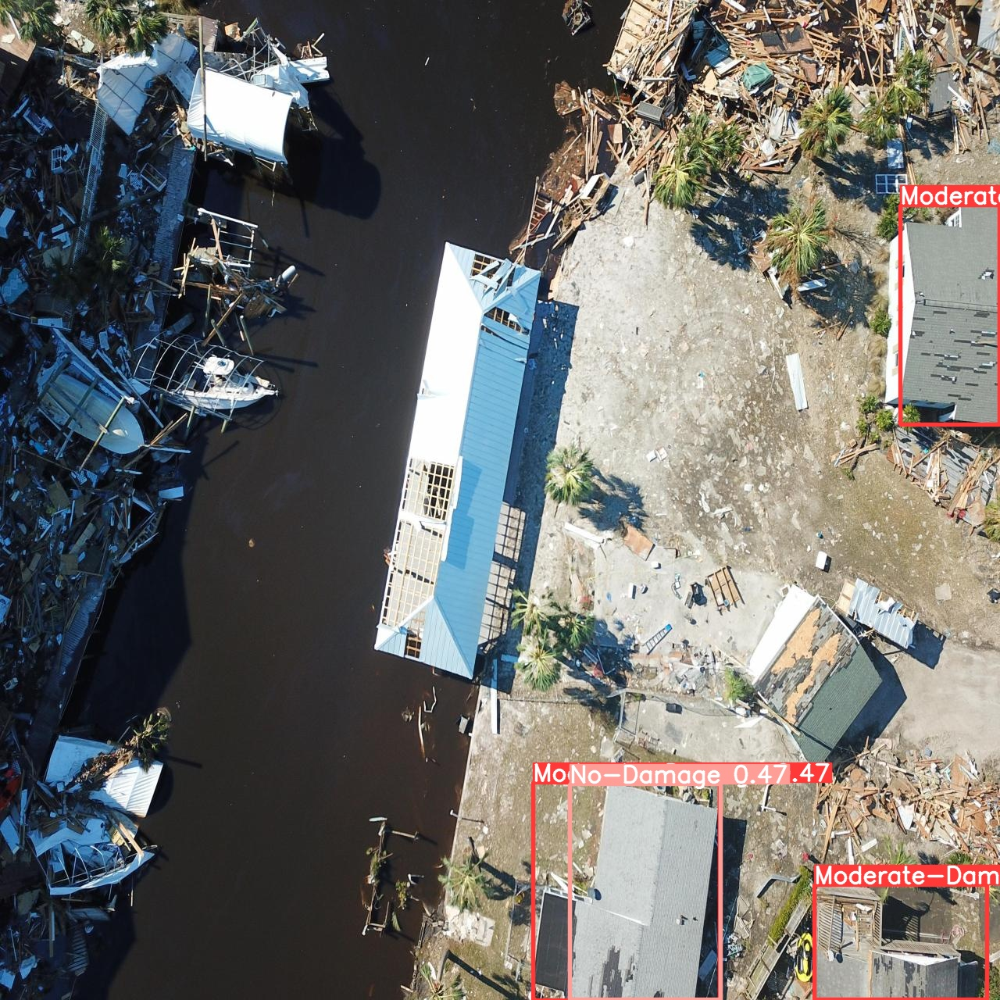

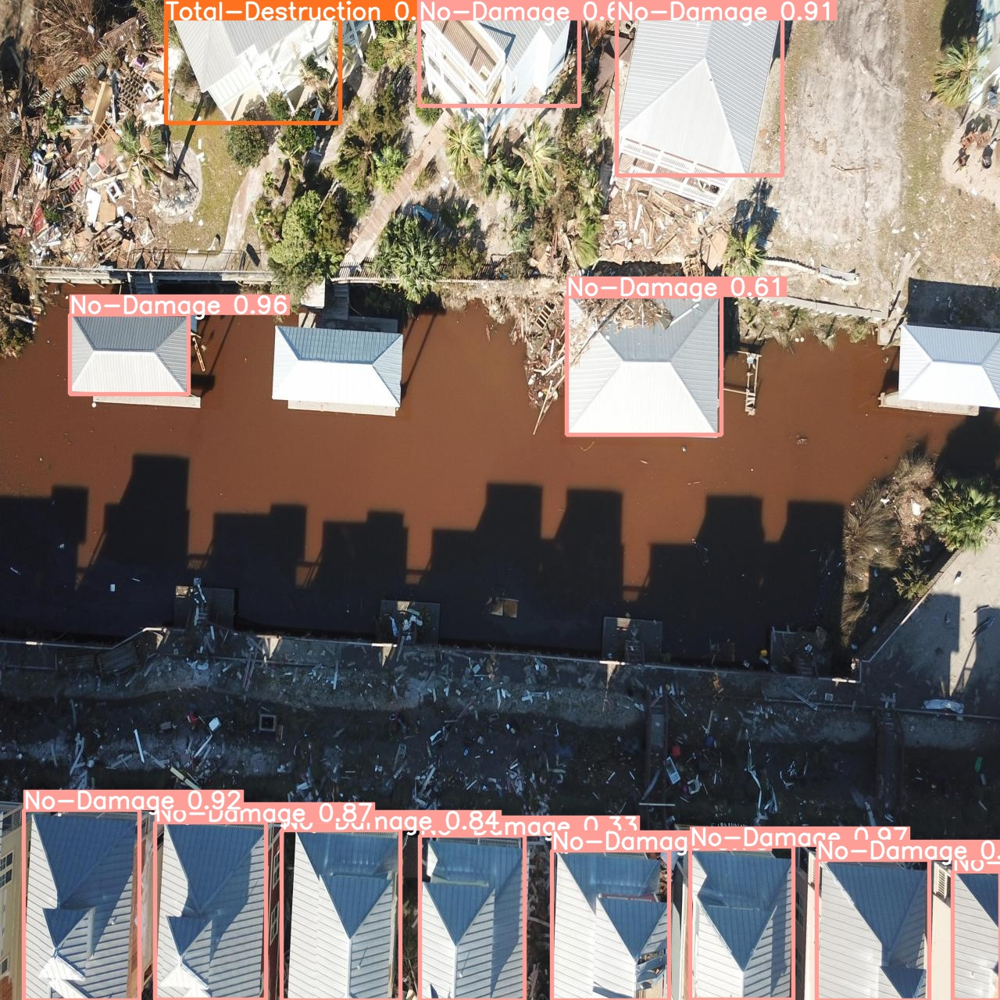

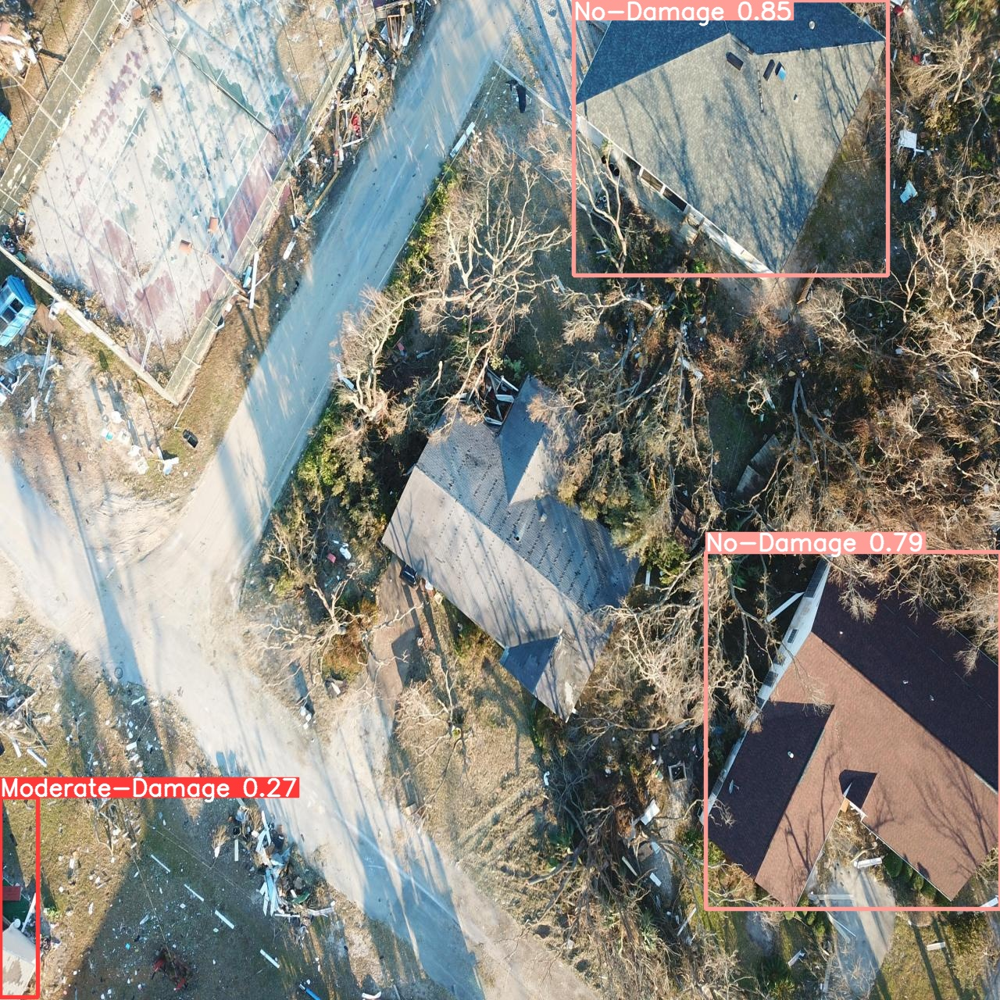

In [28]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict3/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [29]:
project.version(dataset.version).deploy(model_type="yolov8", model_path=f"{HOME}/runs/detect/train/")

View the status of your deployment at: https://app.roboflow.com/ucy/rn-uav6/deploy/1
Share your model with the world at: https://universe.roboflow.com/ucy/rn-uav6/model/1


In [30]:
#Run inference on your model on a persistant, auto-scaling, cloud API

#load model
model = project.version(dataset.version).model

#choose random test set image
import os, random
test_set_loc = dataset.location + "/test/images/"
random_test_image = random.choice(os.listdir(test_set_loc))
print("running inference on " + random_test_image)

pred = model.predict(test_set_loc + random_test_image, confidence=40, overlap=30).json()
pred

running inference on 11916.rf.ea40c3ebcefe8fed79c97d7048a64c24.jpg


HTTPError: ignored